<a href="https://colab.research.google.com/github/krabhinandan/sales-analysis/blob/main/Sales_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



""" Importing the libraries """
import numpy as np
import pandas as pd

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


""" Data Set Link from kaggle """

link = "https://www.kaggle.com/code/saibalpatra/supermarket-sales-data-analysis-saibal-patra"

dataset="https://www.kaggle.com/datasets/yapwh1208/supermarket-sales-data"

In [ ]:
item_category = pd.read_csv("/content/drive/MyDrive/LPU 30th Oct. 23  -  28th Dec. 23/archive/annex1.csv") # reading the file
sales = pd.read_csv("/content/drive/MyDrive/LPU 30th Oct. 23  -  28th Dec. 23/archive/annex2.csv")
wholesale = pd.read_csv("/content/drive/MyDrive/LPU 30th Oct. 23  -  28th Dec. 23/archive/annex3.csv")
loss_rate = pd.read_csv("/content/drive/MyDrive/LPU 30th Oct. 23  -  28th Dec. 23/archive/annex4.csv")


#### " Explore the item_category table "

In [ ]:
# head means  --- it give the 1st five rows of the table
item_category.head()

,Item Code,Item Name,Category Code,Category Name
0,102900005115168,Niushou Shengcai,1011010101,Flower/Leaf Vegetables
1,102900005115199,Sichuan Red Cedar,1011010101,Flower/Leaf Vegetables
2,102900005115625,Local Xiaomao Cabbage,1011010101,Flower/Leaf Vegetables
3,102900005115748,White Caitai,1011010101,Flower/Leaf Vegetables
4,102900005115762,Amaranth,1011010101,Flower/Leaf Vegetables


In [ ]:
print("Checking rows & columns, Rows={}, Columns={}".format(item_category.shape[0],item_category.shape[1]))

Checking rows & columns, Rows=251, Columns=4


In [ ]:
item_category.isnull().sum() # checking the null values in all the columns

Item Code        0
Item Name        0
Category Code    0
Category Name    0
dtype: int64

In [ ]:
# checking the data type of item category table
item_category.dtypes

Item Code         int64
Item Name        object
Category Code     int64
Category Name    object
dtype: object

In [ ]:
# It will give stats of the numberical values columns
item_category.describe().astype(int)

,Item Code,Category Code
count,251,251
mean,103190825064436,1011010414
std,1048400107277,291
min,102900005115168,1011010101
25%,102900011001626,1011010101
50%,102900011029275,1011010501
75%,102900011033746,1011010801
max,106973990980123,1011010801


#### " Exploring the Sales  table"

In [ ]:
sales.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No)
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No


In [ ]:
sales.dtypes
# we have to change the wrong datatype to right data type
# for eg- Time is in object datatype we have to change into timeseries

Date                            object
Time                            object
Item Code                        int64
Quantity Sold (kilo)           float64
Unit Selling Price (RMB/kg)    float64
Sale or Return                  object
Discount (Yes/No)               object
dtype: object

In [ ]:
sales["Date"]=pd.to_datetime(sales["Date"]) # converting the datatype to datetime

In [ ]:
sales.dtypes

Date                           datetime64[ns]
Time                                   object
Item Code                               int64
Quantity Sold (kilo)                  float64
Unit Selling Price (RMB/kg)           float64
Sale or Return                         object
Discount (Yes/No)                      object
dtype: object

In [ ]:
sales.isnull().sum()

Date                           0
Time                           0
Item Code                      0
Quantity Sold (kilo)           0
Unit Selling Price (RMB/kg)    0
Sale or Return                 0
Discount (Yes/No)              0
dtype: int64

In [ ]:
print("Checking rows & columns, Rows={}, Columns={}".format(sales.shape[0], sales.shape[1]))

Checking rows & columns, Rows=878503, Columns=7


In [ ]:
sales.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No)
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No


#### " Exploring the wholesale "

In [ ]:
wholesale.head()

,Date,Item Code,Wholesale Price (RMB/kg)
0,2020-07-01,102900005115762,3.88
1,2020-07-01,102900005115779,6.72
2,2020-07-01,102900005115786,3.19
3,2020-07-01,102900005115793,9.24
4,2020-07-01,102900005115823,7.03


In [ ]:
# checking the data type of whole sale  table
wholesale.dtypes

Date                         object
Item Code                     int64
Wholesale Price (RMB/kg)    float64
dtype: object

In [ ]:
wholesale.isnull().sum() # checking the null

Date                        0
Item Code                   0
Wholesale Price (RMB/kg)    0
dtype: int64

In [ ]:
wholesale["Date"]=pd.to_datetime(wholesale["Date"]) # converting the date column from

In [ ]:
wholesale.dtypes # after converting the Date column from object data type into datetime

Date                        datetime64[ns]
Item Code                            int64
Wholesale Price (RMB/kg)           float64
dtype: object

In [ ]:
print("Checking rows & columns, Rows={}, Columns={}".format(wholesale.shape[0], wholesale.shape[1]))


Checking rows & columns, Rows=55982, Columns=3


In [ ]:
wholesale.describe().astype(int)

,Item Code,Wholesale Price (RMB/kg)
count,55982,55982
mean,103044945365014,5
std,752792703273,5
min,102900005115168,0
25%,102900005116547,2
50%,102900011000328,4
75%,102900011030141,7
max,106973990980123,141


#### "Exploring the Loss rate"

In [ ]:

loss_rate.head()

,Item Code,Item Name,Loss Rate (%)
0,102900005115168,Niushou Shengcai,4.39
1,102900005115199,Sichuan Red Cedar,10.46
2,102900005115250,Xixia Black Mushroom (1),10.80
3,102900005115625,Local Xiaomao Cabbage,0.18
4,102900005115748,White Caitai,8.78


In [ ]:
loss_rate.dtypes

Item Code          int64
Item Name         object
Loss Rate (%)    float64
dtype: object

In [ ]:
loss_rate.isnull().sum()

Item Code        0
Item Name        0
Loss Rate (%)    0
dtype: int64

In [ ]:
loss_rate.describe().astype(int)

,Item Code,Loss Rate (%)
count,251,251
mean,103190825064436,9
std,1048400107277,5
min,102900005115168,0
25%,102900011001626,8
50%,102900011029275,9
75%,102900011033746,11
max,106973990980123,29


# Merging / combing the data

In [ ]:
sales.head(2)

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No)
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No


In [ ]:
wholesale.head(2)

,Date,Item Code,Wholesale Price (RMB/kg)
0,2020-07-01,102900005115762,3.88
1,2020-07-01,102900005115779,6.72


In [ ]:
item_category.head(2)

,Item Code,Item Name,Category Code,Category Name
0,102900005115168,Niushou Shengcai,1011010101,Flower/Leaf Vegetables
1,102900005115199,Sichuan Red Cedar,1011010101,Flower/Leaf Vegetables


In [ ]:
loss_rate.head(2)

,Item Code,Item Name,Loss Rate (%)
0,102900005115168,Niushou Shengcai,4.39
1,102900005115199,Sichuan Red Cedar,10.46


In [ ]:
sales_wholesale_combine_data = pd.merge(sales,wholesale,how="left",on=["Item Code","Date"])
sales_wholesale_combine_data.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg)
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No,4.32
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No,7.03
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No,4.60


In [ ]:
sales_wholesale_combine_data.isnull().sum()

Date                           0
Time                           0
Item Code                      0
Quantity Sold (kilo)           0
Unit Selling Price (RMB/kg)    0
Sale or Return                 0
Discount (Yes/No)              0
Wholesale Price (RMB/kg)       0
dtype: int64

In [ ]:
sales_wholesale_category = pd.merge(sales_wholesale_combine_data,item_category,how="left",on="Item Code")
sales_wholesale_category.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg),Item Name,Category Code,Category Name
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10,Chinese Cabbage,1011010101,Flower/Leaf Vegetables
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No,7.03,Shanghaiqing,1011010101,Flower/Leaf Vegetables
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No,4.60,Caixin,1011010101,Flower/Leaf Vegetables


In [ ]:
final_data = pd.merge(sales_wholesale_category,loss_rate,how="left",on=["Item Code","Item Name"])
final_data.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg),Item Name,Category Code,Category Name,Loss Rate (%)
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10,Chinese Cabbage,1011010101,Flower/Leaf Vegetables,22.27
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No,7.03,Shanghaiqing,1011010101,Flower/Leaf Vegetables,14.43
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No,4.60,Caixin,1011010101,Flower/Leaf Vegetables,13.70


In [ ]:
final_data["total_sales"]=final_data["Quantity Sold (kilo)"]*final_data["Unit Selling Price (RMB/kg)"]

In [ ]:
final_data.head()

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg),Item Name,Category Code,Category Name,Loss Rate (%),total_sales
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08,3.0096
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10,Chinese Cabbage,1011010101,Flower/Leaf Vegetables,22.27,2.7168
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08,3.1084
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No,7.03,Shanghaiqing,1011010101,Flower/Leaf Vegetables,14.43,4.2100
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No,4.60,Caixin,1011010101,Flower/Leaf Vegetables,13.70,4.3120


In [ ]:
final_data.isnull().sum()

Date                           0
Time                           0
Item Code                      0
Quantity Sold (kilo)           0
Unit Selling Price (RMB/kg)    0
Sale or Return                 0
Discount (Yes/No)              0
Wholesale Price (RMB/kg)       0
Item Name                      0
Category Code                  0
Category Name                  0
Loss Rate (%)                  0
total_sales                    0
dtype: int64

In [ ]:
# final_data["Item Name"].nunique()
# final_data["Category Name"].nunique()

# Charts


In [ ]:
# make a group of category name and check the total sales done by category
category_name_wise_sales = final_data.groupby(["Category Name"])["total_sales"].sum().reset_index()
category_name_wise_sales["total_sales"]=category_name_wise_sales["total_sales"].astype(int)

In [ ]:
category_name_wise_sales

,Category Name,total_sales
0,Aquatic Tuberous Vegetables,350089
1,Cabbage,375751
2,Capsicum,754133
3,Edible Mushroom,619597
4,Flower/Leaf Vegetables,1079069
5,Solanum,191124


# "  Creating the charts with the help of metplotlib, seaborn, plotly"

### Matplotlib bar chart

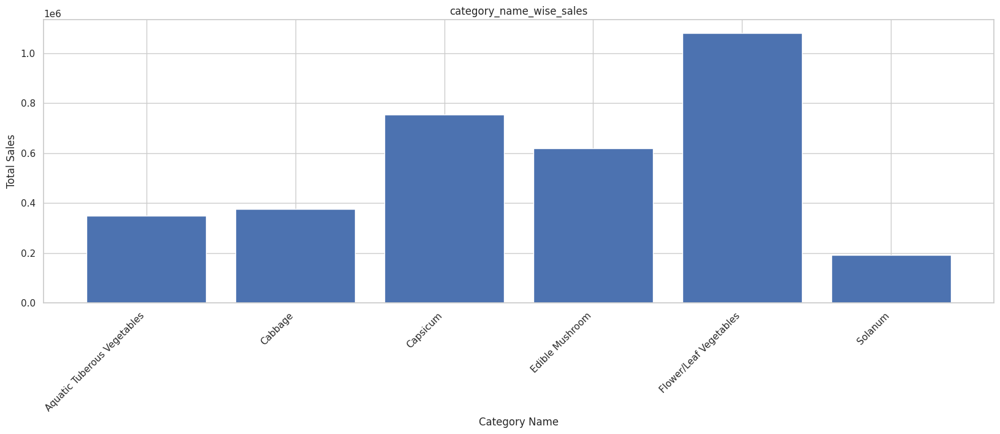

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.bar(category_name_wise_sales['Category Name'], category_name_wise_sales['total_sales'])
plt.xlabel('Category Name')
plt.ylabel('Total Sales')
plt.title('category_name_wise_sales')
plt.xticks(rotation=45, ha='right')
plt.show()

### Seaborn bar chart

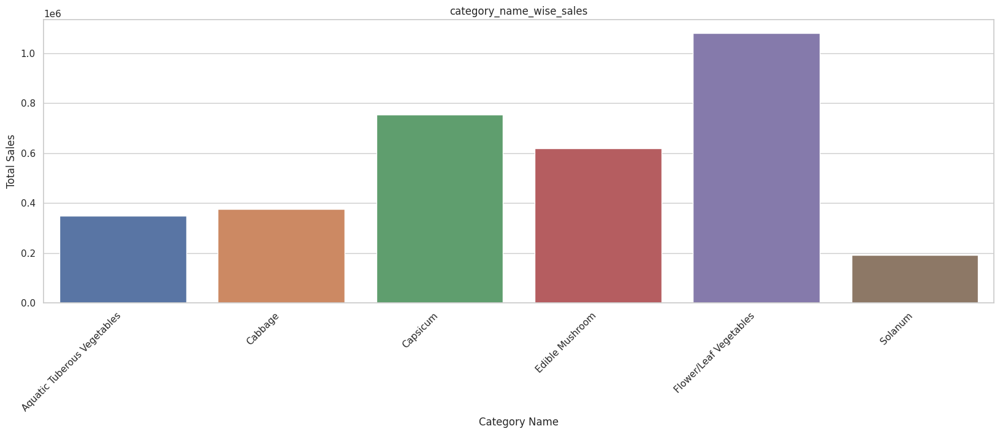

In [ ]:
import seaborn as sns
plt.figure(figsize=(20, 6))
sns.barplot(x='Category Name', y='total_sales', data=category_name_wise_sales)
plt.xlabel('Category Name')
plt.ylabel('Total Sales')
plt.title('category_name_wise_sales')
plt.xticks(rotation=45, ha='right')
plt.show()

### Plotly bar chart

In [ ]:
import plotly.express as px

fig = px.bar(category_name_wise_sales, x='Category Name', y='total_sales', title='category_name_wise_sales')
fig.update_layout(xaxis=dict(tickangle=45))
fig.show()

# Pie chart

### using matplotlib

In [ ]:
category_name_wise_sales

,Category Name,total_sales
0,Aquatic Tuberous Vegetables,350089
1,Cabbage,375751
2,Capsicum,754133
3,Edible Mushroom,619597
4,Flower/Leaf Vegetables,1079069
5,Solanum,191124


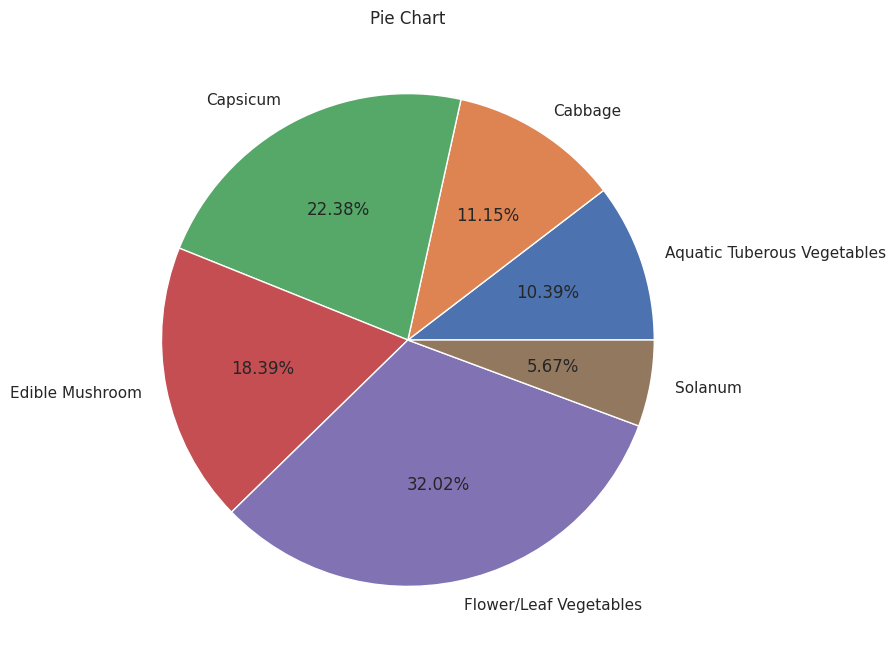

In [ ]:
plt.figure(figsize=(8, 8))
plt.pie(category_name_wise_sales['total_sales'], labels=category_name_wise_sales['Category Name'], autopct='%1.2f%%')
plt.title('Pie Chart')
plt.show()

### using seaborn (same as matplot lib but we can edit it more by ading visualizations or colors)

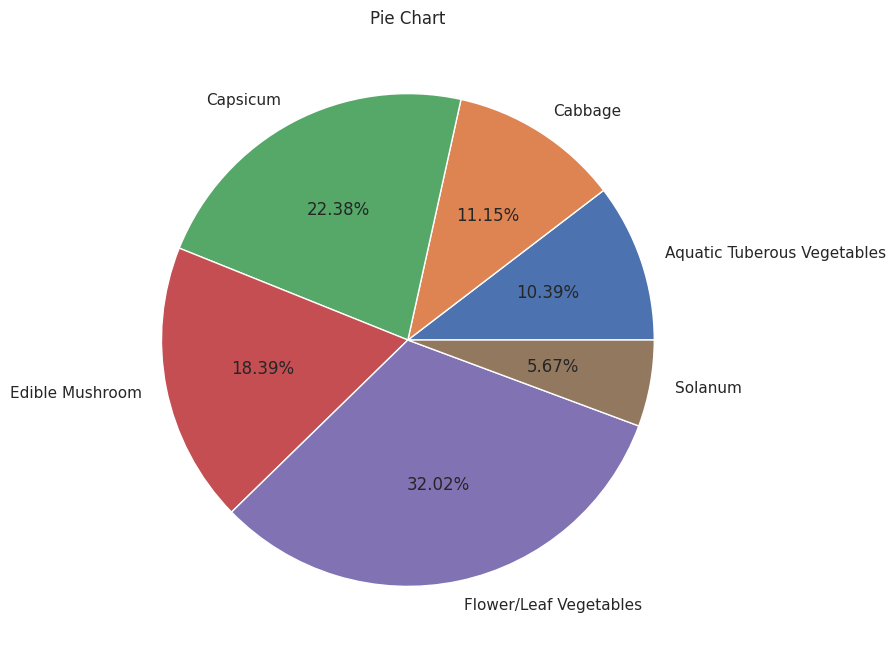

In [ ]:
plt.figure(figsize=(8, 8))
plt.pie(category_name_wise_sales['total_sales'], labels=category_name_wise_sales['Category Name'], autopct='%1.2f%%')
plt.title('Pie Chart')
plt.show()

### using plotly

In [ ]:
fig = px.pie(category_name_wise_sales, values='total_sales', names='Category Name', title='Plotly Pie Chart')
fig.show()

# Line Chart

In [ ]:
# Extract Year and Month
final_data['Year'] = final_data['Date'].dt.year
final_data['Month'] = final_data['Date'].dt.month_name()


In [ ]:
final_data

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg),Item Name,Category Code,Category Name,Loss Rate (%),total_sales,Year,Month
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08,3.0096,2020,July
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10,Chinese Cabbage,1011010101,Flower/Leaf Vegetables,22.27,2.7168,2020,July
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08,3.1084,2020,July
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,sale,No,7.03,Shanghaiqing,1011010101,Flower/Leaf Vegetables,14.43,4.2100,2020,July
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,sale,No,4.60,Caixin,1011010101,Flower/Leaf Vegetables,13.70,4.3120,2020,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
878498,2023-06-30,21:35:13.264,102900005115250,0.284,24.0,sale,No,15.60,Xixia Black Mushroom (1),1011010801,Edible Mushroom,10.80,6.8160,2023,June
878499,2023-06-30,21:35:14.358,102900011022764,0.669,12.0,sale,No,7.00,Changxianqie,1011010501,Solanum,6.90,8.0280,2023,June
878500,2023-06-30,21:35:20.264,102900005115250,0.125,24.0,sale,No,15.60,Xixia Black Mushroom (1),1011010801,Edible Mushroom,10.80,3.0000,2023,June
878501,2023-06-30,21:35:21.509,102900011016701,0.252,5.2,sale,No,3.63,Wuhu Green Pepper (1),1011010504,Capsicum,5.70,1.3104,2023,June


### Matplotlib

In [ ]:
sales_trend = final_data.groupby(final_data['Date'].dt.year)['total_sales'].sum().reset_index()
sales_trend

,Date,total_sales
0,2020,6.695293e+05
1,2021,1.100363e+06
2,2022,1.036772e+06
3,2023,5.631021e+05


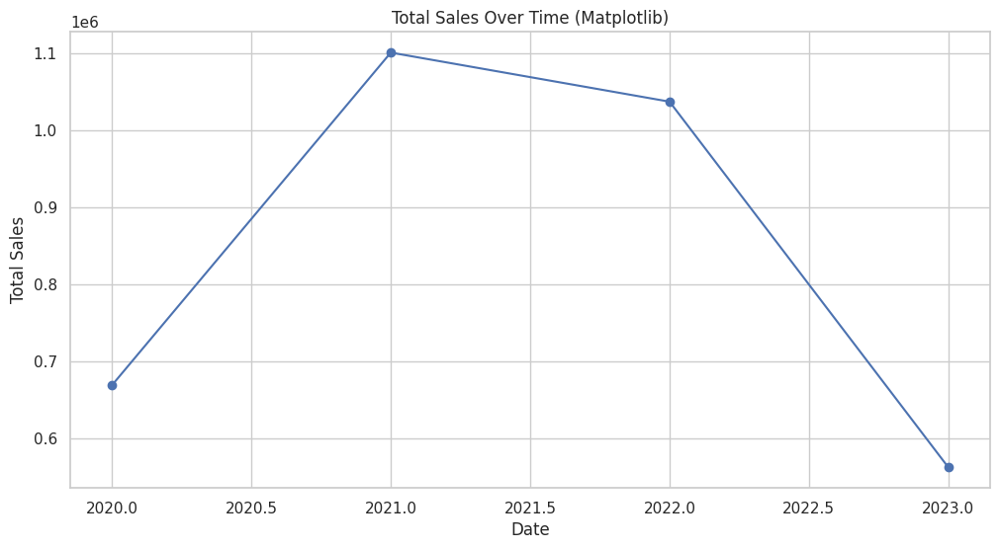

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(sales_trend['Date'], sales_trend['total_sales'], marker='o', linestyle='-', color='b')
plt.title('Total Sales Over Time (Matplotlib)')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.grid(True)
plt.show()

### Seaborn

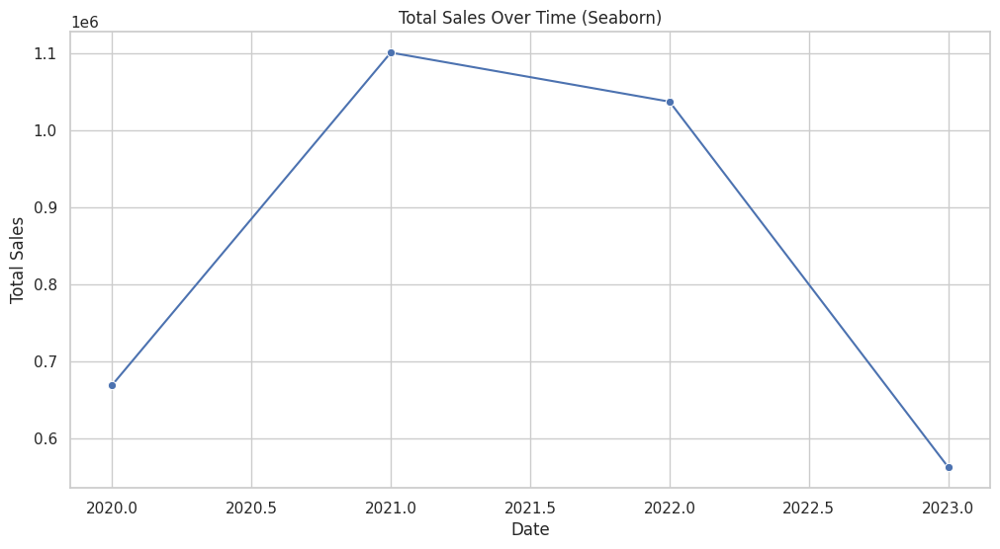

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=sales_trend, x='Date', y='total_sales', marker='o', color='b')
plt.title('Total Sales Over Time (Seaborn)')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.grid(True)
plt.show()

### Plotly

In [ ]:
fig_line = px.line(sales_trend, x='Date', y='total_sales', title='Total Sales Over Time (Plotly Express)', markers=True, line_shape='linear')
fig_line.update_layout(xaxis_title='Date', yaxis_title='Total Sales')
fig_line.show()

# Scatter Plot

Quantity VS Unit Selling Price

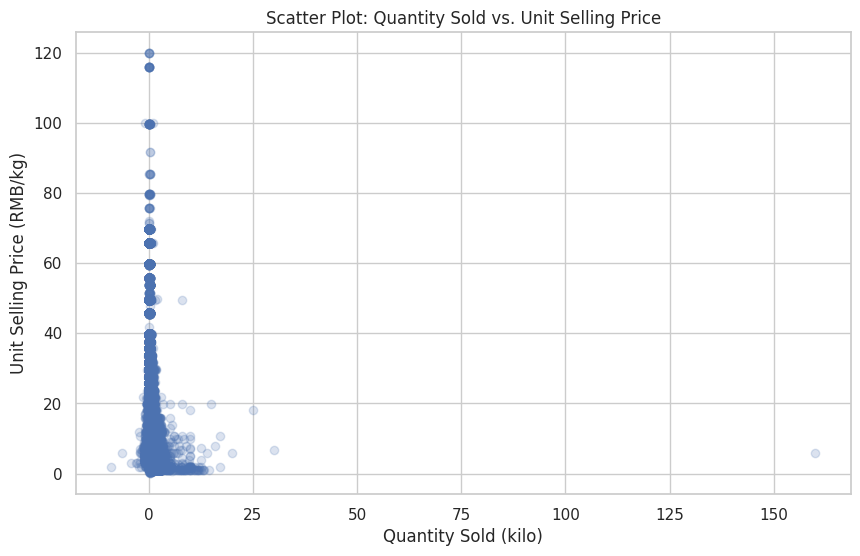

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(final_data['Quantity Sold (kilo)'], final_data['Unit Selling Price (RMB/kg)'], alpha=0.2)
plt.title('Scatter Plot: Quantity Sold vs. Unit Selling Price')
plt.xlabel('Quantity Sold (kilo)')
plt.ylabel('Unit Selling Price (RMB/kg)')
plt.show()


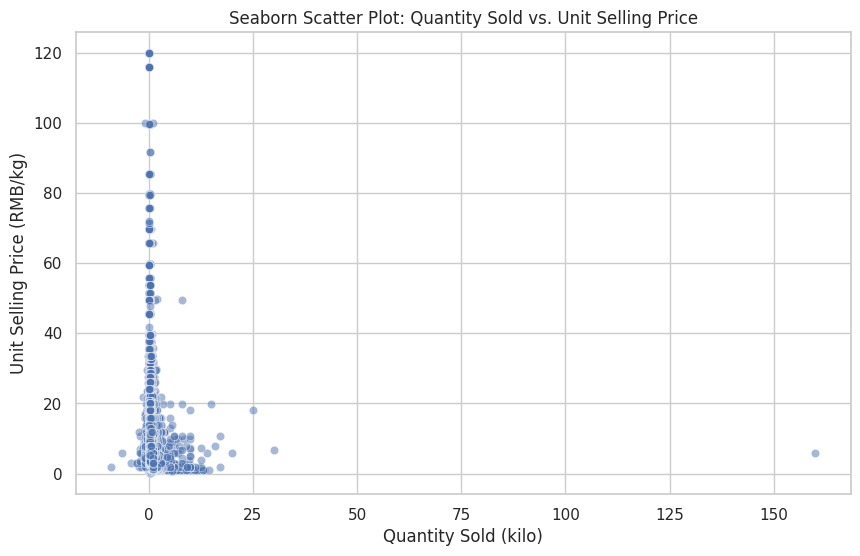

In [ ]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', data=final_data, alpha=0.5)
plt.title('Seaborn Scatter Plot: Quantity Sold vs. Unit Selling Price')
plt.show()

In [ ]:
fig = px.scatter(final_data, x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', title='Plotly Scatter Plot: Quantity Sold vs. Unit Selling Price')
fig.show()

Sum of Quantity Sold and Average Of Unit Selling Price (per Item name)

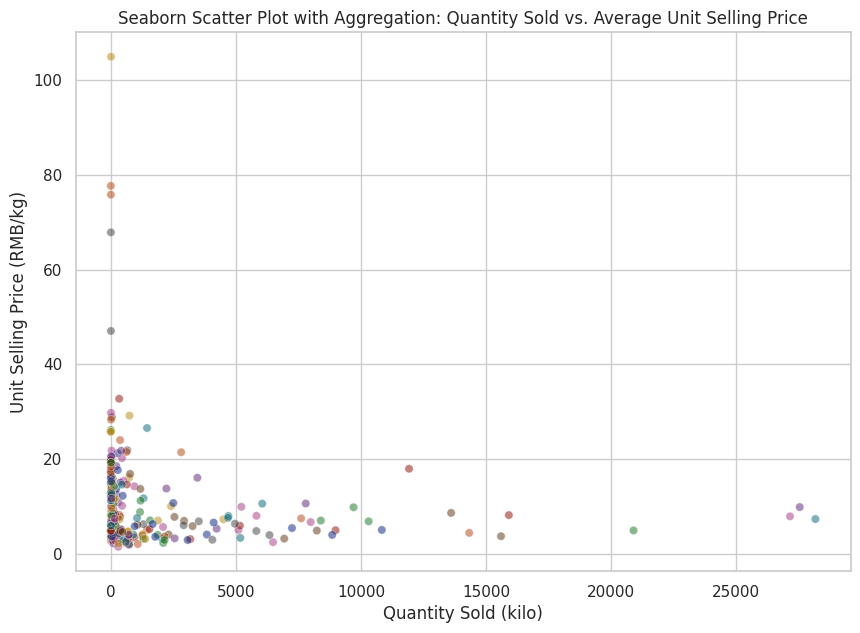

In [ ]:
agg_data = final_data.groupby('Item Name').agg({'Quantity Sold (kilo)': 'sum', 'Unit Selling Price (RMB/kg)': 'mean'}).reset_index()


plt.figure(figsize=(10, 7))
sns.scatterplot(x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', data=agg_data, alpha=0.5, hue='Item Name',palette='dark', legend=False)
plt.title('Seaborn Scatter Plot with Aggregation: Quantity Sold vs. Average Unit Selling Price')
plt.show()


In [ ]:
agg_data = final_data.groupby('Item Name').agg({'Quantity Sold (kilo)': 'sum', 'Unit Selling Price (RMB/kg)': 'mean'}).reset_index()

# Scatter plot using Plotly with aggregation
fig = px.scatter(agg_data, x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', color='Item Name',
                 title='Plotly Scatter Plot with Aggregation: Quantity Sold vs. Average Unit Selling Price')
fig.show()

In [ ]:
final_data.head(2)

,Date,Time,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Sale or Return,Discount (Yes/No),Wholesale Price (RMB/kg),Item Name,Category Code,Category Name,Loss Rate (%),total_sales,Year,Month
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,sale,No,4.32,Paopaojiao (Jingpin),1011010504,Capsicum,7.08,3.0096,2020,July
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,sale,No,2.10,Chinese Cabbage,1011010101,Flower/Leaf Vegetables,22.27,2.7168,2020,July


# Scatter 3D Plot Plotly

Based on Category Name

In [ ]:
agg_data = final_data.groupby('Category Name').agg({
    'Quantity Sold (kilo)': 'sum',
    'Unit Selling Price (RMB/kg)': 'mean',
    'total_sales': 'sum'  # Assuming 'total_sales' is a column you want to sum
}).reset_index()


In [ ]:
fig = px.scatter_3d(agg_data, x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', z='total_sales',
                    title='Plotly 3D Scatter Plot: Quantity Sold vs. Average Unit Selling Price vs. Total Sales',
                    color='Category Name', symbol='Category Name',
                    color_discrete_sequence=px.colors.qualitative.Set1)

fig.show()

Based on Item Name

In [ ]:
agg_data = final_data.groupby('Item Name').agg({
    'Quantity Sold (kilo)': 'sum',
    'Unit Selling Price (RMB/kg)': 'mean',
    'total_sales': 'sum'  # Assuming 'total_sales' is a column you want to sum
}).reset_index()


In [ ]:
fig = px.scatter_3d(agg_data, x='Quantity Sold (kilo)', y='Unit Selling Price (RMB/kg)', z='total_sales',
                    title='Plotly 3D Scatter Plot: Quantity Sold vs. Average Unit Selling Price vs. Total Sales',
                    color='Item Name', symbol='Item Name')

fig.show()

# Seaborn Correlation

In [ ]:
correlation_matrix = final_data.corr()
correlation_matrix

<ipython-input-320-e8d538bc49c9>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Item Code,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Wholesale Price (RMB/kg),Category Code,Loss Rate (%),total_sales,Year
Item Code,1.000000,0.212891,-0.152789,-0.144599,0.307052,-0.266643,-0.012147,0.119615
Quantity Sold (kilo),0.212891,1.000000,-0.374163,-0.363975,-0.097333,-0.064141,0.524797,0.188677
Unit Selling Price (RMB/kg),-0.152789,-0.374163,1.000000,0.958943,0.331646,0.046217,0.339107,-0.079342
Wholesale Price (RMB/kg),-0.144599,-0.363975,0.958943,1.000000,0.333595,0.025472,0.325845,-0.070093
Category Code,0.307052,-0.097333,0.331646,0.333595,1.000000,-0.381446,0.105203,0.009351
Loss Rate (%),-0.266643,-0.064141,0.046217,0.025472,-0.381446,1.000000,-0.045221,-0.176838
total_sales,-0.012147,0.524797,0.339107,0.325845,0.105203,-0.045221,1.000000,0.081466
Year,0.119615,0.188677,-0.079342,-0.070093,0.009351,-0.176838,0.081466,1.000000



# Create a heatmap using Seaborn

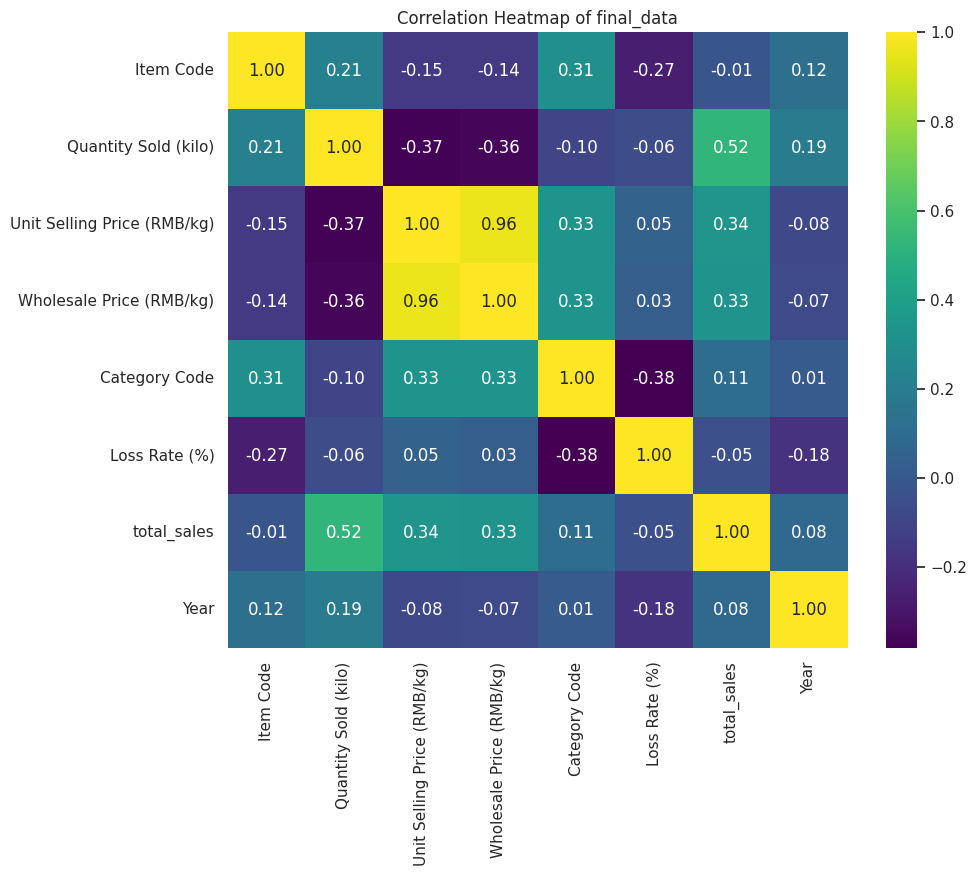

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt='.2f')
plt.title('Correlation Heatmap of final_data')
plt.show()

Finding correlation between two or more columns

In [ ]:
final_data[["Quantity Sold (kilo)","Unit Selling Price (RMB/kg)","Wholesale Price (RMB/kg)"]].corr()

,Quantity Sold (kilo),Unit Selling Price (RMB/kg),Wholesale Price (RMB/kg)
Quantity Sold (kilo),1.000000,-0.374163,-0.363975
Unit Selling Price (RMB/kg),-0.374163,1.000000,0.958943
Wholesale Price (RMB/kg),-0.363975,0.958943,1.000000
